# Roget's Thesaurus (Embedding's prediction)

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2024 <br>

## 1. About the notebook
---

> The purpose of this notebook is to performe a part of the hole project (<b>Roget's Thesaurus in the 21st Century</b>) which is the section prediction of the embeddings we created in notebook <b>Roget's Data and Embeddings</b>

>This Jupyter Notebook is focused on the application of machine learning models to predict the categories of word embeddings previously generated from textual data extracted from Gutenberg's website.

## 2. Libraries
---

In [1]:
# Data Loading and Manipulation
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank

# Data Normalization, Metrics and Dimensionality reduction
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA

# Classification Models and Ensemble Models
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Model validation and Hyperparameter tuning
from sklearn.model_selection import cross_val_score
import optuna

# Save the model
from joblib import dump

In [2]:
import warnings
warnings.filterwarnings('ignore')

## 3. Data loading and Preparation

> Load the data and insert in each one the appropriate columns for the prediction. In our case the roget's section.

In [3]:
roget_words = pd.read_csv("Words/Roget's_Words.csv")
print(roget_words.shape)
roget_words.head()

(88353, 6)


,Class,Division,Primary_Section,Sub_Section,Word,Section
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",existence,SECTION I. EXISTENCE
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",being,SECTION I. EXISTENCE
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",entity,SECTION I. EXISTENCE
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",subsistence,SECTION I. EXISTENCE
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",reality,SECTION I. EXISTENCE


In [4]:
sentence_tranformer_embeddings = pd.read_json('Embeddings/sentence_tranformer_embeddings.json')
sentence_tranformer_embeddings.head()

,Embeddings
0,"[-0.06880877170000001, 0.0015575370000000001, ..."
1,"[0.0024004122000000003, 0.020551782100000002, ..."
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000..."
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0...."
4,"[-0.0132661257, 0.0121876495, -0.0619583502000..."


In [5]:
sentence_tranformer_embeddings = pd.merge(sentence_tranformer_embeddings,
                                          roget_words['Section'],
                                          left_index=True,
                                          right_index=True,
                                          how='outer'
                                          )
sentence_tranformer_embeddings

,Embeddings,Section
0,"[-0.06880877170000001, 0.0015575370000000001, ...",SECTION I. EXISTENCE
1,"[0.0024004122000000003, 0.020551782100000002, ...",SECTION I. EXISTENCE
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000...",SECTION I. EXISTENCE
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0....",SECTION I. EXISTENCE
4,"[-0.0132661257, 0.0121876495, -0.0619583502000...",SECTION I. EXISTENCE
...,...,...
88348,"[0.0255490765, 0.0240662042, -0.0762141049, -0...",SECTION V. RELIGIOUS AFFECTIONS
88349,"[0.0169134196, -0.0647304654, -0.0094027240000...",SECTION V. RELIGIOUS AFFECTIONS
88350,"[0.073002696, -0.024290988200000002, -0.079109...",SECTION V. RELIGIOUS AFFECTIONS
88351,"[0.0125833051, 0.0338308141, -0.01210350360000...",SECTION V. RELIGIOUS AFFECTIONS


In [6]:
use_embeddings = pd.read_json('Embeddings/universal_sentence_encoder_embeddings.json')
use_embeddings.head()

,Embeddings
0,"[-0.0396379605, -0.042999919500000004, -0.0274..."
1,"[-0.0382796377, -0.0570409745, 0.0563224480000..."
2,"[-0.040613506, 0.013880508000000001, -0.027027..."
3,"[-0.0177038833, -0.0793429762, -0.018696246700..."
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0...."


In [7]:
use_embeddings = pd.merge(use_embeddings,
                          roget_words['Section'],
                          left_index=True,
                          right_index=True,
                          how='outer'
                          )
use_embeddings

,Embeddings,Section
0,"[-0.0396379605, -0.042999919500000004, -0.0274...",SECTION I. EXISTENCE
1,"[-0.0382796377, -0.0570409745, 0.0563224480000...",SECTION I. EXISTENCE
2,"[-0.040613506, 0.013880508000000001, -0.027027...",SECTION I. EXISTENCE
3,"[-0.0177038833, -0.0793429762, -0.018696246700...",SECTION I. EXISTENCE
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0....",SECTION I. EXISTENCE
...,...,...
88348,"[0.0491876565, -0.0453704819, 0.0396645963, -0...",SECTION V. RELIGIOUS AFFECTIONS
88349,"[-0.0353110284, -0.0295349434, 0.0116038844, 0...",SECTION V. RELIGIOUS AFFECTIONS
88350,"[0.0113966716, -0.035985540600000004, 0.031265...",SECTION V. RELIGIOUS AFFECTIONS
88351,"[-0.05716852100000001, 0.027027575300000002, -...",SECTION V. RELIGIOUS AFFECTIONS


In [8]:
def pca_embeddings(dfs: list):
    for df in dfs:
        pca = PCA(n_components=150, random_state=33)
        df['Embeddings_PCA'] = pd.DataFrame(zip(pca.fit_transform(list(df.Embeddings.values))))

pca_embeddings([use_embeddings, sentence_tranformer_embeddings])

In [9]:
use_embeddings.head()

,Embeddings,Section,Embeddings_PCA
0,"[-0.0396379605, -0.042999919500000004, -0.0274...",SECTION I. EXISTENCE,"[-0.06893568869159591, 0.1027777164428846, 0.3..."
1,"[-0.0382796377, -0.0570409745, 0.0563224480000...",SECTION I. EXISTENCE,"[-0.11345175298240011, 0.48437962496388265, 0...."
2,"[-0.040613506, 0.013880508000000001, -0.027027...",SECTION I. EXISTENCE,"[-0.11053508425422834, 0.11641474567663747, 0...."
3,"[-0.0177038833, -0.0793429762, -0.018696246700...",SECTION I. EXISTENCE,"[-0.12826338882400537, 0.036488339197278584, -..."
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0....",SECTION I. EXISTENCE,"[-0.0021210803540472425, 0.13100554804182293, ..."


## 4. Modeling

> The dataset is way too big to use it untuched to train the models and do predictions. We will take a sample of it excactly the 20% of each section. Then we will create the train and test data and we will also scale the X data.

In [10]:
def embeddings_sample(df):
    sampled_df = pd.DataFrame()  # Empty DataFrame to store samples
    for cluster in df.Section.unique():
        cluster_df = df[df['Section'] == cluster]
        sampled_cluster = cluster_df.sample(int(len(cluster_df) / 5))
        sampled_df = pd.concat([sampled_df, sampled_cluster])

    return sampled_df

In [11]:
sample_df = embeddings_sample(use_embeddings)

X = pd.DataFrame(list(sample_df.Embeddings.values))
y_section = sample_df.Section

X_train, X_test, y_section_train, y_section_test = train_test_split(X, y_section, test_size=0.3)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_scaled = scaler.fit_transform(X)

> The rest 80% of the data that was left behind will be used to check if the models training have gone well and to see if we have overfitting. So we take all the indexes that don't exist in the sample data we took before.

In [12]:
rest_data = use_embeddings.loc[~use_embeddings.index.isin(sample_df.index)]

X_rest = pd.DataFrame(list(rest_data.Embeddings))
X_rest_scaled = scaler.fit_transform(X_rest)

y_section_rest = rest_data.Section

> Initialize a function to automaticly plot a confusion matrix for the data that l will give it from every model and a function to plot the classification report.

In [13]:
def confusion_matrix_plot(y_true, predictions, fig_width=10, fig_height=8, size=10):
    plt.figure(figsize=(fig_width, fig_height))
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_true, predictions)
    
    # Calculate percentage of true positives for each class
    cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
    
    # Format the percentages to include the '%' sign
    cm_percentage_text = np.array([["{:.2f}%".format(value) for value in row] for row in cm_percentage])
    
    # Use seaborn to create a heatmap with formatted text annotations
    sns.heatmap(cm_percentage, annot=cm_percentage_text, cmap='Blues', fmt='', annot_kws={"size": size}, vmin=0, vmax=100)
    
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix (Percentage of TP per Class)')
    plt.show()

In [14]:
def classification_reporting(y_true, predictions):
    print(classification_report(y_true, predictions))

> We chose 7 different models to use in the section prediction notebook where with all these model we will follow a specific pattern to find the best parameters and optimize the accuracy. The pattern is the following:

> We will first initialize the model without parameters in order to see the score it can hit without any modifiction. The we will use the optuna to modify some of the parameters and find the best combination. If the optuna goes better than the befault then we will take the parameters of the best trial that optuna had and train a model with this parameters in the whole sample data we took. This means we will not train in with the train and score of the test but we will use both of this datasets and score on the rest 80% we left behind.

> The best model that we will save will be the model with the highest score on the rest 80% of the data.

### SGD

In [15]:
sgd = SGDClassifier(random_state=33)
sgd.fit(X_train_scaled, y_section_train)

SGDClassifier(random_state=33)

In [16]:
sgd.score(X_test_scaled, y_section_test)

0.19230043404415928

In [17]:
classification_reporting(y_section_test, sgd.predict(X_test_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.25      0.25      0.25       434
    DIVISION (I) INDIVIDUAL VOLITION       0.23      0.28      0.25       886
DIVISION (II) COMMUNICATION OF IDEAS       0.18      0.26      0.21       392
  DIVISION (II) INTERSOCIAL VOLITION       0.24      0.29      0.27       422
    SECTION I. AFFECTIONS IN GENERAL       0.14      0.10      0.12        59
                SECTION I. EXISTENCE       0.00      0.00      0.00        33
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00        21
         SECTION I. SPACE IN GENERAL       0.27      0.14      0.19        85
              SECTION II. DIMENSIONS       0.14      0.15      0.15       246
        SECTION II. INORGANIC MATTER       0.14      0.10      0.11       126
     SECTION II. PERSONAL AFFECTIONS       0.18      0.17      0.18       432
                SECTION II. RELATION       0.29      0.15      

In [18]:
def objective_sgd_section(trial):

    alpha = trial.suggest_float('alpha', 0.01, 1)
    epsilon = trial.suggest_float('epsilon', 0.01, 1)
    l1_ratio = trial.suggest_float('l1_ratio', 0.01, 1)
    penalty = trial.suggest_categorical('penalty', [None, 'l1', 'l2'])
    warm_start = trial.suggest_categorical('warm_start', [True, False])
    
    sgd = SGDClassifier(alpha=alpha,
                         epsilon=epsilon,
                         l1_ratio=l1_ratio,
                         penalty=penalty,
                         warm_start=warm_start,
                         max_iter=50,
                         random_state=33
                         )

    score = cross_val_score(sgd, X_train_scaled, y_section_train, cv=5, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [19]:
study_sgd = optuna.create_study(direction="maximize")
study_sgd.optimize(objective_sgd_section, n_trials=20, n_jobs=-1)

[I 2024-02-22 22:45:39,484] A new study created in memory with name: no-name-4b5f25df-ac47-422c-a742-6c8ad8abbc4f
[I 2024-02-22 22:46:23,604] Trial 7 finished with value: 0.21622837322696772 and parameters: {'alpha': 0.636157455701322, 'epsilon': 0.49713945179080415, 'l1_ratio': 0.8309466289933038, 'penalty': 'l2', 'warm_start': False}. Best is trial 7 with value: 0.21622837322696772.
[I 2024-02-22 22:46:26,174] Trial 2 finished with value: 0.2042558662683192 and parameters: {'alpha': 0.9561519291751716, 'epsilon': 0.7206014922467014, 'l1_ratio': 0.866238621523119, 'penalty': 'l2', 'warm_start': True}. Best is trial 7 with value: 0.21622837322696772.
[I 2024-02-22 22:46:26,843] Trial 3 finished with value: 0.21210219235052485 and parameters: {'alpha': 0.1319913953448298, 'epsilon': 0.4029384856635647, 'l1_ratio': 0.7382339766025366, 'penalty': 'l2', 'warm_start': False}. Best is trial 7 with value: 0.21622837322696772.
[I 2024-02-22 22:46:28,474] Trial 10 finished with value: 0.1692282

In [20]:
print('Best trial:')
trial = study_sgd.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.21622837322696772
Params: 
  alpha: 0.636157455701322
  epsilon: 0.49713945179080415
  l1_ratio: 0.8309466289933038
  penalty: l2
  warm_start: False


In [21]:
fig = plot_optimization_history(study_sgd)

fig.update_layout(yaxis_range=[0, 1], title="Stochastic Gradient Descent Optuna's Performance")
fig.show()

In [22]:
fig = plot_param_importances(study_sgd)

fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparameter Importance")
fig.show()

In [23]:
fig = plot_rank(study_sgd)
fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [24]:
sgd_section = SGDClassifier(**study_sgd.best_trial.params, random_state=33)
sgd_section.fit(X_scaled, y_section)

SGDClassifier(alpha=0.636157455701322, epsilon=0.49713945179080415,
              l1_ratio=0.8309466289933038, random_state=33)

In [25]:
sgd_section.score(X_rest_scaled, y_section_rest)

0.20057432241271997

In [26]:
classification_reporting(y_section_rest, sgd_section.predict(X_rest_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.52      0.20      0.29      5603
    DIVISION (I) INDIVIDUAL VOLITION       0.17      0.96      0.29     11912
DIVISION (II) COMMUNICATION OF IDEAS       0.56      0.08      0.13      5475
  DIVISION (II) INTERSOCIAL VOLITION       0.55      0.08      0.13      5510
    SECTION I. AFFECTIONS IN GENERAL       0.00      0.00      0.00       893
                SECTION I. EXISTENCE       0.00      0.00      0.00       466
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00       295
         SECTION I. SPACE IN GENERAL       0.00      0.00      0.00      1079
              SECTION II. DIMENSIONS       0.33      0.03      0.05      3072
        SECTION II. INORGANIC MATTER       0.43      0.00      0.00      1626
     SECTION II. PERSONAL AFFECTIONS       0.43      0.05      0.10      5833
                SECTION II. RELATION       0.00      0.00      

### SVC

In [27]:
svc = SVC(max_iter=150, random_state=33)
svc.fit(X_train_scaled, y_section_train)

SVC(max_iter=150, random_state=33)

In [28]:
svc.score(X_test_scaled, y_section_test)

0.21305906774863181

In [29]:
classification_reporting(y_section_test, svc.predict(X_test_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.21      0.42      0.28       434
    DIVISION (I) INDIVIDUAL VOLITION       0.24      0.23      0.24       886
DIVISION (II) COMMUNICATION OF IDEAS       0.21      0.18      0.20       392
  DIVISION (II) INTERSOCIAL VOLITION       0.23      0.26      0.24       422
    SECTION I. AFFECTIONS IN GENERAL       0.14      0.10      0.12        59
                SECTION I. EXISTENCE       0.00      0.00      0.00        33
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00        21
         SECTION I. SPACE IN GENERAL       0.25      0.19      0.22        85
              SECTION II. DIMENSIONS       0.18      0.23      0.20       246
        SECTION II. INORGANIC MATTER       0.15      0.18      0.17       126
     SECTION II. PERSONAL AFFECTIONS       0.24      0.21      0.22       432
                SECTION II. RELATION       0.32      0.24      

In [30]:
def objective_svc_section(trial):
    C = trial.suggest_float('C', 0.01, 1)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf'])
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
    degree = trial.suggest_int('degree', 2, 6)
    
    svc = SVC(C=C, gamma=gamma, kernel=kernel, degree=degree, max_iter=150, random_state=33)

    score = cross_val_score(svc, X_train_scaled, y_section_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [31]:
study_svc = optuna.create_study(direction="maximize")
study_svc.optimize(objective_svc_section, n_trials=20, n_jobs=-1)

[I 2024-02-22 22:47:17,402] A new study created in memory with name: no-name-19ee213c-a038-45fb-976e-a7a7e9d77b9a
[I 2024-02-22 22:48:00,506] Trial 1 finished with value: 0.027180082103546787 and parameters: {'C': 0.7039635474886811, 'kernel': 'poly', 'gamma': 'auto', 'degree': 6}. Best is trial 1 with value: 0.027180082103546787.
[I 2024-02-22 22:48:02,580] Trial 0 finished with value: 0.026937429088525 and parameters: {'C': 0.7371882728552704, 'kernel': 'poly', 'gamma': 'scale', 'degree': 6}. Best is trial 1 with value: 0.027180082103546787.
[I 2024-02-22 22:48:30,019] Trial 3 finished with value: 0.16712380440145153 and parameters: {'C': 0.06542811919484647, 'kernel': 'linear', 'gamma': 'auto', 'degree': 6}. Best is trial 3 with value: 0.16712380440145153.
[I 2024-02-22 22:48:31,559] Trial 2 finished with value: 0.027584449268932953 and parameters: {'C': 0.85852830825974, 'kernel': 'poly', 'gamma': 'auto', 'degree': 5}. Best is trial 3 with value: 0.16712380440145153.
[I 2024-02-22 

In [32]:
print('Best trial:')
trial = study_svc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.21121134138665218
Params: 
  C: 0.9342772051032767
  kernel: rbf
  gamma: auto
  degree: 5


In [33]:
fig = plot_optimization_history(study_svc)
fig.update_layout(yaxis_range=[0, 1], title="Support Vector Machine Optuna's Performance")
fig.show()

In [34]:
fig = plot_param_importances(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparameter Importance")
fig.show()

In [35]:
fig = plot_rank(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [36]:
svc_section = SVC(**study_svc.best_trial.params, max_iter=200, random_state=33)
svc_section.fit(X_scaled, y_section)

SVC(C=0.9342772051032767, degree=5, gamma='auto', max_iter=200, random_state=33)

In [37]:
svc_section.score(X_rest_scaled, y_section_rest)

0.2224579867594636

In [38]:
classification_reporting(y_section_rest, svc_section.predict(X_rest_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.24      0.37      0.29      5603
    DIVISION (I) INDIVIDUAL VOLITION       0.23      0.42      0.30     11912
DIVISION (II) COMMUNICATION OF IDEAS       0.25      0.21      0.23      5475
  DIVISION (II) INTERSOCIAL VOLITION       0.25      0.20      0.22      5510
    SECTION I. AFFECTIONS IN GENERAL       0.18      0.13      0.15       893
                SECTION I. EXISTENCE       0.15      0.02      0.03       466
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00       295
         SECTION I. SPACE IN GENERAL       0.27      0.23      0.25      1079
              SECTION II. DIMENSIONS       0.19      0.20      0.19      3072
        SECTION II. INORGANIC MATTER       0.20      0.22      0.21      1626
     SECTION II. PERSONAL AFFECTIONS       0.18      0.12      0.14      5833
                SECTION II. RELATION       0.27      0.20      

### Random Forest

In [39]:
rf = RandomForestClassifier(random_state=33)
rf.fit(X_train_scaled, y_section_train)

RandomForestClassifier(random_state=33)

In [40]:
rf.score(X_test_scaled, y_section_test)

0.22570296282317417

In [41]:
classification_reporting(y_section_test, rf.predict(X_test_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.37      0.27      0.31       434
    DIVISION (I) INDIVIDUAL VOLITION       0.20      0.69      0.30       886
DIVISION (II) COMMUNICATION OF IDEAS       0.28      0.21      0.24       392
  DIVISION (II) INTERSOCIAL VOLITION       0.33      0.22      0.27       422
    SECTION I. AFFECTIONS IN GENERAL       0.00      0.00      0.00        59
                SECTION I. EXISTENCE       0.11      0.03      0.05        33
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00        21
         SECTION I. SPACE IN GENERAL       0.00      0.00      0.00        85
              SECTION II. DIMENSIONS       0.26      0.08      0.12       246
        SECTION II. INORGANIC MATTER       0.15      0.03      0.05       126
     SECTION II. PERSONAL AFFECTIONS       0.27      0.21      0.23       432
                SECTION II. RELATION       0.06      0.01      

In [42]:
def objective_rf_section(trial):

    n_estimators = trial.suggest_int('n_estimators', low=50, high=150, step=50)
    max_depth = trial.suggest_int('max_depth', 1, 30)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5)
    bootstrap = trial.suggest_categorical('bootstrap', [True, False])
    
    rfc_optuna = RandomForestClassifier(n_estimators=n_estimators,
                                        max_depth=max_depth,
                                        min_samples_split=min_samples_split,
                                        min_samples_leaf=min_samples_leaf,
                                        bootstrap=bootstrap,
                                        n_jobs=-1,
                                        random_state=33,
                                        )

    score = cross_val_score(rfc_optuna, X_train_scaled, y_section_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [43]:
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf_section, n_trials=15, n_jobs=-1)

[I 2024-02-22 22:58:07,615] A new study created in memory with name: no-name-6a8a10cc-e63e-4a18-a961-16f52639fc3c
[I 2024-02-22 22:59:35,368] Trial 4 finished with value: 0.2243975387256807 and parameters: {'n_estimators': 50, 'max_depth': 14, 'min_samples_split': 5, 'min_samples_leaf': 5, 'bootstrap': False}. Best is trial 4 with value: 0.2243975387256807.
[I 2024-02-22 22:59:35,626] Trial 1 finished with value: 0.21428531702254902 and parameters: {'n_estimators': 50, 'max_depth': 17, 'min_samples_split': 3, 'min_samples_leaf': 1, 'bootstrap': True}. Best is trial 4 with value: 0.2243975387256807.
[I 2024-02-22 22:59:40,515] Trial 2 finished with value: 0.19333491023441515 and parameters: {'n_estimators': 150, 'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 5, 'bootstrap': False}. Best is trial 4 with value: 0.2243975387256807.
[I 2024-02-22 22:59:40,601] Trial 0 finished with value: 0.21169717086933706 and parameters: {'n_estimators': 150, 'max_depth': 10, 'min_samples_sp

In [44]:
print('Best trial:')
trial = study_rf.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.23353846133713357
Params: 
  n_estimators: 150
  max_depth: 27
  min_samples_split: 4
  min_samples_leaf: 3
  bootstrap: False


In [45]:
fig = plot_optimization_history(study_rf)
fig.update_layout(yaxis_range=[0, 1], title="Random Forest Optuna's Performance")
fig.show()

In [46]:
fig = plot_param_importances(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparameter Importance")
fig.show()

In [47]:
fig = plot_rank(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [48]:
rf_section = RandomForestClassifier(**study_rf.best_trial.params, random_state=33, n_jobs=-1)
rf_section.fit(X_scaled, y_section)

RandomForestClassifier(bootstrap=False, max_depth=27, min_samples_leaf=3,
                       min_samples_split=4, n_estimators=150, n_jobs=-1,
                       random_state=33)

In [49]:
rf_section.score(X_rest_scaled, y_section_rest)

0.24743959712555877

In [50]:
classification_reporting(y_section_rest, rf_section.predict(X_rest_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.38      0.30      0.34      5603
    DIVISION (I) INDIVIDUAL VOLITION       0.20      0.72      0.32     11912
DIVISION (II) COMMUNICATION OF IDEAS       0.35      0.22      0.27      5475
  DIVISION (II) INTERSOCIAL VOLITION       0.40      0.23      0.30      5510
    SECTION I. AFFECTIONS IN GENERAL       0.00      0.00      0.00       893
                SECTION I. EXISTENCE       0.08      0.02      0.03       466
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00       295
         SECTION I. SPACE IN GENERAL       0.12      0.02      0.04      1079
              SECTION II. DIMENSIONS       0.25      0.12      0.16      3072
        SECTION II. INORGANIC MATTER       0.15      0.03      0.05      1626
     SECTION II. PERSONAL AFFECTIONS       0.29      0.19      0.23      5833
                SECTION II. RELATION       0.09      0.02      

### AdaBoost

In [51]:
adaboost = AdaBoostClassifier(random_state=33)
adaboost.fit(X_train_scaled, y_section_train)

AdaBoostClassifier(random_state=33)

In [52]:
adaboost.score(X_test_scaled, y_section_test)

0.18248726174749952

In [53]:
classification_reporting(y_section_test, adaboost.predict(X_test_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.17      0.02      0.04       434
    DIVISION (I) INDIVIDUAL VOLITION       0.17      0.78      0.28       886
DIVISION (II) COMMUNICATION OF IDEAS       0.00      0.00      0.00       392
  DIVISION (II) INTERSOCIAL VOLITION       0.38      0.22      0.28       422
    SECTION I. AFFECTIONS IN GENERAL       0.00      0.00      0.00        59
                SECTION I. EXISTENCE       0.00      0.00      0.00        33
        SECTION I. MATTER IN GENERAL       0.07      0.24      0.11        21
         SECTION I. SPACE IN GENERAL       0.06      0.04      0.04        85
              SECTION II. DIMENSIONS       0.09      0.02      0.04       246
        SECTION II. INORGANIC MATTER       0.00      0.00      0.00       126
     SECTION II. PERSONAL AFFECTIONS       0.20      0.03      0.05       432
                SECTION II. RELATION       0.00      0.00      

In [54]:
def objective_ada_section(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200, step=50),
        # 'learning_rate': trial.suggest_float('learning_rate', .01, .05),
        'random_state': 33
    }
    adaboost = AdaBoostClassifier(**params)
    
    score = cross_val_score(adaboost,
                            X_train_scaled,
                            y_section_train,
                            scoring='accuracy',
                            cv=3,
                            n_jobs=-1)

    return score.mean()

In [55]:
study_adaboost = optuna.create_study(direction='maximize')
study_adaboost.optimize(objective_ada_section, n_trials=10, n_jobs=-1)

[I 2024-02-22 23:01:41,662] A new study created in memory with name: no-name-67145c8d-5e01-4741-852d-ec597987f686
[I 2024-02-22 23:02:20,949] Trial 3 finished with value: 0.17351555573355823 and parameters: {'n_estimators': 50}. Best is trial 3 with value: 0.17351555573355823.
[I 2024-02-22 23:03:39,694] Trial 1 finished with value: 0.1662348465394314 and parameters: {'n_estimators': 150}. Best is trial 3 with value: 0.17351555573355823.
[I 2024-02-22 23:04:17,960] Trial 8 finished with value: 0.16696313930778417 and parameters: {'n_estimators': 100}. Best is trial 3 with value: 0.17351555573355823.
[I 2024-02-22 23:04:18,508] Trial 6 finished with value: 0.17351555573355823 and parameters: {'n_estimators': 50}. Best is trial 3 with value: 0.17351555573355823.
[I 2024-02-22 23:04:18,613] Trial 0 finished with value: 0.16518310586945542 and parameters: {'n_estimators': 200}. Best is trial 3 with value: 0.17351555573355823.
[I 2024-02-22 23:04:51,991] Trial 9 finished with value: 0.16696

In [56]:
print('Best trial:')
trial = study_adaboost.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.17351555573355823
Params: 
  n_estimators: 50


In [57]:
trials_df = study_adaboost.trials_dataframe()
trials_df.sort_values(by='value', ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_n_estimators,state
3,3,0.173516,2024-02-22 23:01:41.677768,2024-02-22 23:02:20.949993,0 days 00:00:39.272225,50,COMPLETE
6,6,0.173516,2024-02-22 23:01:41.689716,2024-02-22 23:04:18.508988,0 days 00:02:36.819272,50,COMPLETE
8,8,0.166963,2024-02-22 23:01:41.697645,2024-02-22 23:04:17.960512,0 days 00:02:36.262867,100,COMPLETE
9,9,0.166963,2024-02-22 23:01:41.702645,2024-02-22 23:04:51.991205,0 days 00:03:10.288560,100,COMPLETE
1,1,0.166235,2024-02-22 23:01:41.669823,2024-02-22 23:03:39.694947,0 days 00:01:58.025124,150,COMPLETE
4,4,0.166235,2024-02-22 23:01:41.682396,2024-02-22 23:05:25.327655,0 days 00:03:43.645259,150,COMPLETE
5,5,0.166235,2024-02-22 23:01:41.683041,2024-02-22 23:05:24.862761,0 days 00:03:43.179720,150,COMPLETE
7,7,0.166235,2024-02-22 23:01:41.693715,2024-02-22 23:05:24.946226,0 days 00:03:43.252511,150,COMPLETE
0,0,0.165183,2024-02-22 23:01:41.662062,2024-02-22 23:04:18.613215,0 days 00:02:36.951153,200,COMPLETE
2,2,0.165183,2024-02-22 23:01:41.672823,2024-02-22 23:05:53.561114,0 days 00:04:11.888291,200,COMPLETE


In [58]:
fig = plot_optimization_history(study_adaboost)
fig.update_layout(yaxis_range=[0, 1], title="AdaBoost Optuna's Performance")
fig.show()

In [59]:
fig = plot_param_importances(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparameter Importance")
fig.show()

In [60]:
fig = plot_rank(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparams Rank (Objective Value)")
fig.show()

In [61]:
adaboost_section = AdaBoostClassifier(**study_adaboost.best_trial.params)
adaboost_section.fit(X_scaled, y_section)

AdaBoostClassifier()

In [62]:
adaboost_section.score(X_rest_scaled, y_section_rest)

0.19266677983364455

In [63]:
classification_reporting(y_section_rest, adaboost_section.predict(X_rest_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.20      0.17      0.19      5603
    DIVISION (I) INDIVIDUAL VOLITION       0.18      0.72      0.28     11912
DIVISION (II) COMMUNICATION OF IDEAS       0.25      0.07      0.10      5475
  DIVISION (II) INTERSOCIAL VOLITION       0.39      0.20      0.27      5510
    SECTION I. AFFECTIONS IN GENERAL       0.00      0.00      0.00       893
                SECTION I. EXISTENCE       0.00      0.00      0.00       466
        SECTION I. MATTER IN GENERAL       0.04      0.07      0.05       295
         SECTION I. SPACE IN GENERAL       0.22      0.09      0.13      1079
              SECTION II. DIMENSIONS       0.19      0.05      0.08      3072
        SECTION II. INORGANIC MATTER       0.11      0.02      0.03      1626
     SECTION II. PERSONAL AFFECTIONS       0.20      0.01      0.02      5833
                SECTION II. RELATION       0.10      0.05      

### Extra Trees

In [64]:
etc = ExtraTreesClassifier()
etc.fit(X_train_scaled, y_section_train)

ExtraTreesClassifier()

In [65]:
etc.score(X_test_scaled, y_section_test)

0.21739950934138516

In [66]:
classification_reporting(y_section_test, etc.predict(X_test_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.36      0.26      0.31       434
    DIVISION (I) INDIVIDUAL VOLITION       0.20      0.74      0.31       886
DIVISION (II) COMMUNICATION OF IDEAS       0.25      0.19      0.22       392
  DIVISION (II) INTERSOCIAL VOLITION       0.30      0.18      0.22       422
    SECTION I. AFFECTIONS IN GENERAL       0.00      0.00      0.00        59
                SECTION I. EXISTENCE       0.11      0.03      0.05        33
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00        21
         SECTION I. SPACE IN GENERAL       0.11      0.02      0.04        85
              SECTION II. DIMENSIONS       0.16      0.04      0.06       246
        SECTION II. INORGANIC MATTER       0.05      0.01      0.01       126
     SECTION II. PERSONAL AFFECTIONS       0.27      0.19      0.22       432
                SECTION II. RELATION       0.06      0.01      

In [67]:
def objective_etc_section(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500, step=50),
        'max_depth': trial.suggest_int('max_depth', 5, 30),
        'min_samples_split': trial.suggest_float('min_samples_split', 0.01, 0.5, log=True),
        'min_samples_leaf': trial.suggest_float('min_samples_leaf', 0.01, 0.5, log=True),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
        'min_weight_fraction_leaf': trial.suggest_float('min_weight_fraction_leaf', 0.0, 0.2),
    }
    etc_optuna = ExtraTreesClassifier(**params)

    score = cross_val_score(etc_optuna, X_train_scaled, y_section_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [68]:
study_etc = optuna.create_study(direction='maximize')
study_etc.optimize(objective_etc_section, n_trials=30, n_jobs=-1)

[I 2024-02-22 23:07:11,158] A new study created in memory with name: no-name-c9066b53-f7b3-4f60-b866-fc154cec6675
[I 2024-02-22 23:07:13,559] Trial 0 finished with value: 0.16922828031412393 and parameters: {'n_estimators': 150, 'max_depth': 6, 'min_samples_split': 0.016309337653507058, 'min_samples_leaf': 0.05434987292593739, 'max_features': 'sqrt', 'min_weight_fraction_leaf': 0.18166324022940317}. Best is trial 0 with value: 0.16922828031412393.
[I 2024-02-22 23:07:17,119] Trial 4 finished with value: 0.16922828031412393 and parameters: {'n_estimators': 400, 'max_depth': 6, 'min_samples_split': 0.08757596963869775, 'min_samples_leaf': 0.038677192066124404, 'max_features': 'log2', 'min_weight_fraction_leaf': 0.14311266997072622}. Best is trial 0 with value: 0.16922828031412393.
[I 2024-02-22 23:07:19,200] Trial 1 finished with value: 0.16922828031412393 and parameters: {'n_estimators': 450, 'max_depth': 23, 'min_samples_split': 0.3494095324797869, 'min_samples_leaf': 0.047856035400158

In [69]:
print('Best trial:')
trial = study_etc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.16922828031412393
Params: 
  n_estimators: 150
  max_depth: 6
  min_samples_split: 0.016309337653507058
  min_samples_leaf: 0.05434987292593739
  max_features: sqrt
  min_weight_fraction_leaf: 0.18166324022940317


In [70]:
trials_df = study_etc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_max_depth,params_max_features,params_min_samples_leaf,params_min_samples_split,params_min_weight_fraction_leaf,params_n_estimators,state
0,0,0.169228,2024-02-22 23:07:11.158947,2024-02-22 23:07:13.559929,0 days 00:00:02.400982,6,sqrt,0.054350,0.016309,0.181663,150,COMPLETE
37,37,0.169228,2024-02-22 23:07:30.496095,2024-02-22 23:07:57.747785,0 days 00:00:27.251690,8,sqrt,0.057242,0.134236,0.195569,500,COMPLETE
27,27,0.169228,2024-02-22 23:07:24.824319,2024-02-22 23:07:35.099449,0 days 00:00:10.275130,21,sqrt,0.053922,0.029277,0.060005,100,COMPLETE
28,28,0.169228,2024-02-22 23:07:25.020468,2024-02-22 23:07:40.312795,0 days 00:00:15.292327,23,sqrt,0.043442,0.039660,0.199747,500,COMPLETE
29,29,0.169228,2024-02-22 23:07:25.697612,2024-02-22 23:07:41.797341,0 days 00:00:16.099729,24,sqrt,0.047002,0.036417,0.199694,500,COMPLETE


In [71]:
fig = plot_optimization_history(study_etc)
fig.update_layout(yaxis_range=[0, 1], title="Extra Tree Optuna's Performance", width=930, height=550)
fig.show()

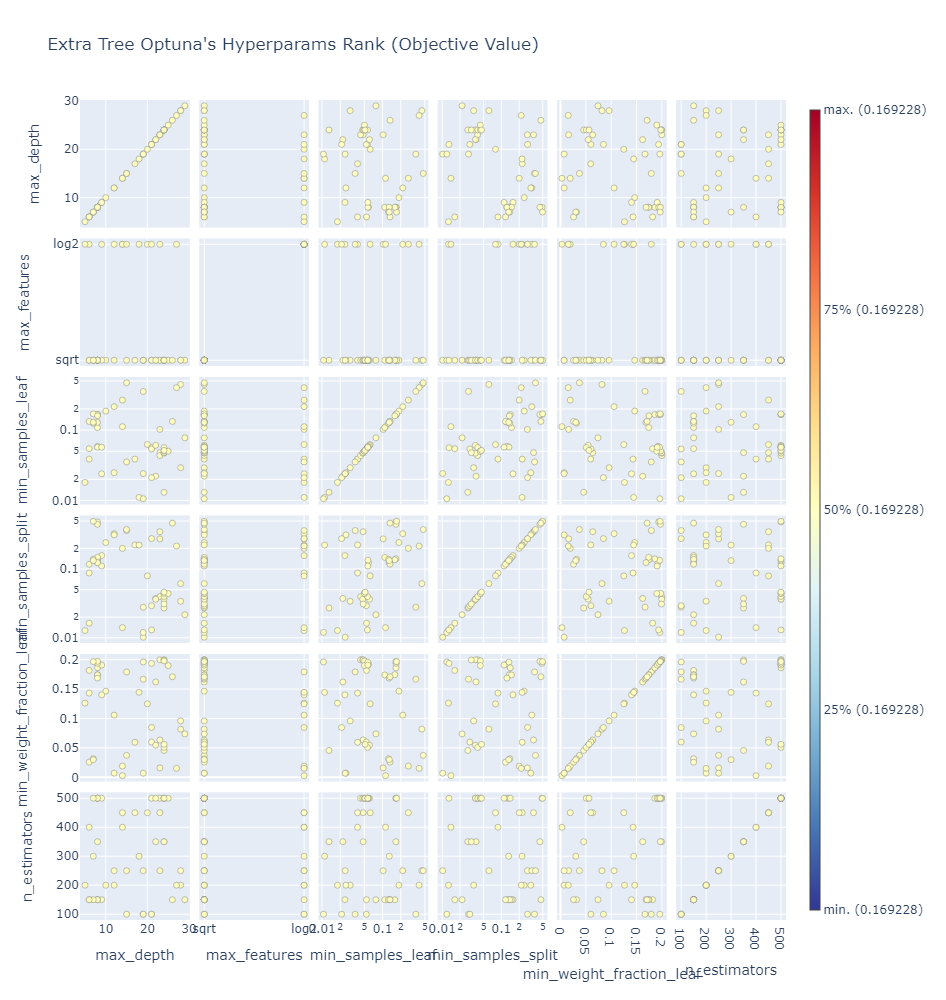

In [74]:
fig = plot_rank(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [75]:
etc_section = ExtraTreesClassifier()
etc_section.fit(X_scaled, y_section)

ExtraTreesClassifier()

In [76]:
etc_section.score(X_rest_scaled, y_section_rest)

0.220944378430374

In [77]:
classification_reporting(y_section_rest, etc_section.predict(X_rest_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.33      0.28      0.30      5603
    DIVISION (I) INDIVIDUAL VOLITION       0.20      0.70      0.31     11912
DIVISION (II) COMMUNICATION OF IDEAS       0.28      0.18      0.22      5475
  DIVISION (II) INTERSOCIAL VOLITION       0.31      0.20      0.24      5510
    SECTION I. AFFECTIONS IN GENERAL       0.03      0.01      0.01       893
                SECTION I. EXISTENCE       0.07      0.02      0.03       466
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00       295
         SECTION I. SPACE IN GENERAL       0.13      0.03      0.04      1079
              SECTION II. DIMENSIONS       0.19      0.07      0.10      3072
        SECTION II. INORGANIC MATTER       0.11      0.02      0.04      1626
     SECTION II. PERSONAL AFFECTIONS       0.24      0.18      0.20      5833
                SECTION II. RELATION       0.11      0.03      

### XGBoost

In [78]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit the encoder to the class labels and transform them to numeric labels
y_section_encoded = label_encoder.fit_transform(y_section)
y_section_train_encoded = label_encoder.fit_transform(y_section_train)
y_section_test_encoded = label_encoder.fit_transform(y_section_test)
y_section_rest_encoded = label_encoder.fit_transform(y_section_rest)

In [79]:
xgboost = XGBClassifier(use_label_encoder=False, n_jobs=-1, random_state=33)
xgboost.fit(X_train_scaled, y_section_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [80]:
xgboost.score(X_test_scaled, y_section_test_encoded)

0.23834685789771656

In [81]:
classification_reporting(y_section_test_encoded, xgboost.predict(X_test_scaled))

              precision    recall  f1-score   support

           0       0.35      0.28      0.31       434
           1       0.21      0.56      0.30       886
           2       0.27      0.28      0.28       392
           3       0.30      0.27      0.28       422
           4       0.06      0.02      0.03        59
           5       0.11      0.03      0.05        33
           6       0.00      0.00      0.00        21
           7       0.20      0.06      0.09        85
           8       0.25      0.14      0.18       246
           9       0.18      0.06      0.09       126
          10       0.24      0.24      0.24       432
          11       0.19      0.07      0.11        68
          12       0.17      0.05      0.08       122
          13       0.25      0.26      0.25       392
          14       0.16      0.05      0.08       156
          15       0.28      0.07      0.11       176
          16       0.21      0.08      0.12       296
          17       0.19    

In [82]:
def objective_xgb_section(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 5),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'lambda': trial.suggest_float('lambda', 0, 10),
        'alpha': trial.suggest_float('alpha', 0, 10),
        'objective': 'multi:softmax',
        'num_class': 6,
        'eval_metric': 'mlogloss',
        'use_label_encoder': False,
    }
    
    xgboost = XGBClassifier(**params, n_jobs=-1, random_state=33)
    score = cross_val_score(xgboost, X_train_scaled, y_section_train_encoded, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [83]:
study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb_section, n_trials=10, n_jobs=-1)

[I 2024-02-22 23:16:12,454] A new study created in memory with name: no-name-1cf38cde-4284-4d21-b847-838b8737b99d
[I 2024-02-22 23:17:45,649] Trial 0 finished with value: 0.23580323844481144 and parameters: {'n_estimators': 50, 'max_depth': 5, 'learning_rate': 0.02468894954569388, 'min_child_weight': 8, 'gamma': 7.794296563070362, 'subsample': 0.9404692690694583, 'colsample_bytree': 0.9992912779744276, 'lambda': 1.323835734216663, 'alpha': 5.196054951860754}. Best is trial 0 with value: 0.23580323844481144.
[I 2024-02-22 23:18:14,007] Trial 3 finished with value: 0.2206763408510675 and parameters: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.019748609594356755, 'min_child_weight': 1, 'gamma': 4.7429104490700515, 'subsample': 0.9030097810554365, 'colsample_bytree': 0.9080999078200127, 'lambda': 9.612215366762396, 'alpha': 7.646885353666032}. Best is trial 0 with value: 0.23580323844481144.
[I 2024-02-22 23:18:44,500] Trial 2 finished with value: 0.2556223196525178 and paramet

In [84]:
print('Best trial:')
trial = study_xgb.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.2556223196525178
Params: 
  n_estimators: 100
  max_depth: 5
  learning_rate: 0.04384241025612852
  min_child_weight: 3
  gamma: 6.921899263427361
  subsample: 0.6715612383094571
  colsample_bytree: 0.913374696645104
  lambda: 3.911006914777415
  alpha: 0.7283568834733367


In [85]:
trials_df = study_xgb.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,state
2,2,0.255622,2024-02-22 23:16:12.461500,2024-02-22 23:18:44.500457,0 days 00:02:32.038957,0.728357,0.913375,6.921899,3.911007,0.043842,5,3,100,0.671561,COMPLETE
7,7,0.254328,2024-02-22 23:16:12.469874,2024-02-22 23:20:19.797310,0 days 00:04:07.327436,3.468605,0.634441,2.926996,2.353651,0.026773,4,8,200,0.973806,COMPLETE
8,8,0.252791,2024-02-22 23:16:12.477313,2024-02-22 23:20:01.807956,0 days 00:03:49.330643,8.688283,0.742512,2.079723,5.896547,0.049661,5,9,250,0.632382,COMPLETE
5,5,0.249555,2024-02-22 23:16:12.469874,2024-02-22 23:19:54.605227,0 days 00:03:42.135353,6.188204,0.512485,1.884555,7.868068,0.022758,3,4,250,0.725969,COMPLETE
4,4,0.238068,2024-02-22 23:16:12.461500,2024-02-22 23:18:46.392402,0 days 00:02:33.930902,4.347400,0.590473,1.870817,5.483925,0.033276,5,3,50,0.997277,COMPLETE


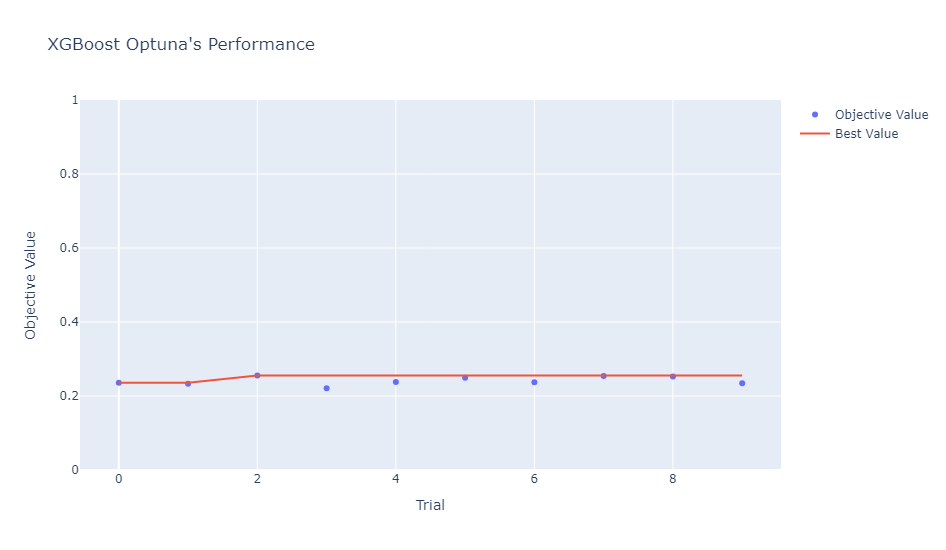

In [86]:
fig = plot_optimization_history(study_xgb)
fig.update_layout(yaxis_range=[0, 1], title="XGBoost Optuna's Performance", width=930, height=550)
fig.show()

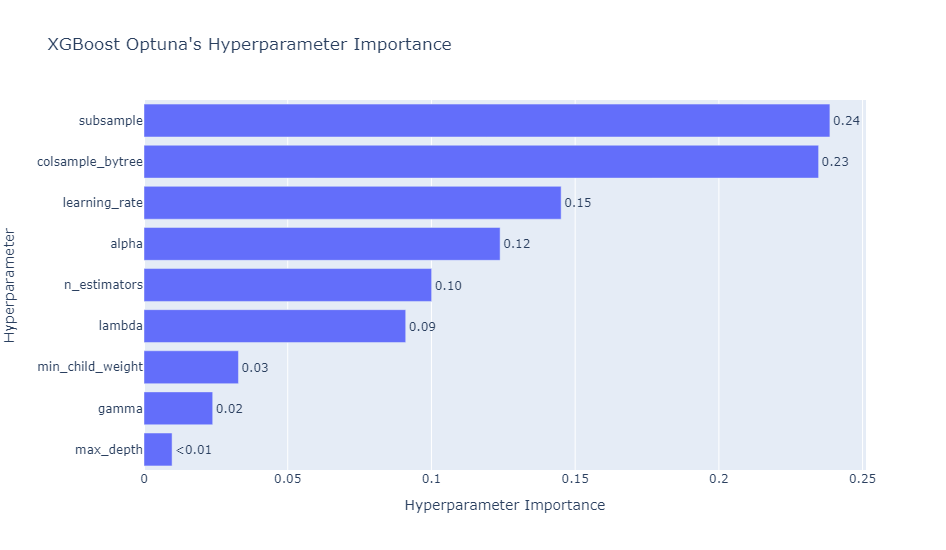

In [87]:
fig = plot_param_importances(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

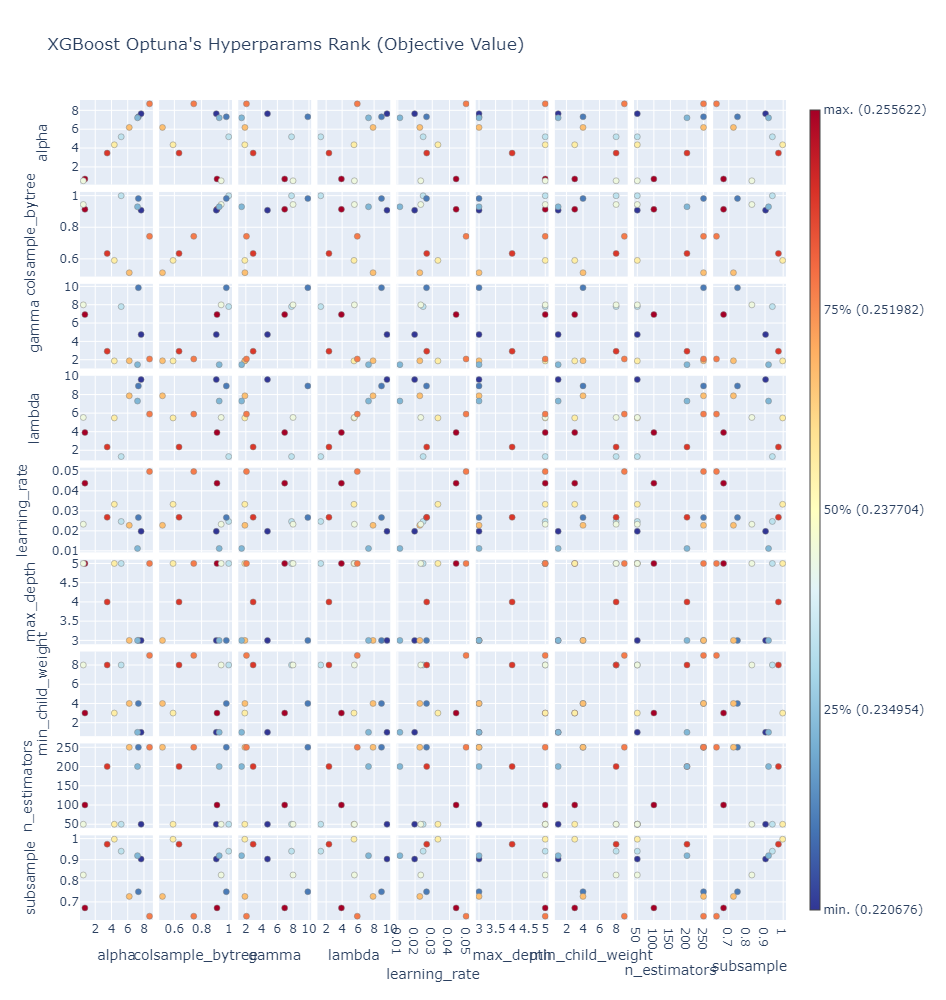

In [88]:
fig = plot_rank(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [89]:
xgboost_section = XGBClassifier(**study_xgb.best_trial.params, n_jobs=-1, random_state=33)
xgboost_section.fit(X_scaled, y_section_encoded)

XGBClassifier(alpha=0.7283568834733367, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.913374696645104, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=6.921899263427361,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=3.911006914777415,
              learning_rate=0.04384241025612852, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=-1, ...)

In [90]:
xgboost_section.score(X_rest_scaled, y_section_rest_encoded)

0.28075312623776383

In [91]:
classification_reporting(y_section_rest_encoded, xgboost_section.predict(X_rest_scaled))

              precision    recall  f1-score   support

           0       0.39      0.33      0.36      5603
           1       0.22      0.70      0.33     11912
           2       0.36      0.25      0.30      5475
           3       0.41      0.29      0.34      5510
           4       0.32      0.02      0.03       893
           5       1.00      0.00      0.00       466
           6       1.00      0.00      0.01       295
           7       0.36      0.11      0.17      1079
           8       0.25      0.19      0.22      3072
           9       0.33      0.11      0.16      1626
          10       0.30      0.22      0.25      5833
          11       0.36      0.09      0.14       950
          12       0.32      0.05      0.08      1573
          13       0.32      0.29      0.30      5220
          14       0.32      0.05      0.08      2275
          15       0.43      0.10      0.16      2328
          16       0.39      0.12      0.19      3800
          17       0.33    

### LightGBM

In [92]:
lgbm = LGBMClassifier()
lgbm.fit(X_train_scaled, y_section_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 130560
[LightGBM] [Info] Number of data points in the train set: 12362, number of used features: 512
[LightGBM] [Info] Start training from score -2.549219
[LightGBM] [Info] Start training from score -1.776507
[LightGBM] [Info] Start training from score -2.538920
[LightGBM] [Info] Start training from score -2.560671
[LightGBM] [Info] Start training from score -4.322516
[LightGBM] [Info] Start training from score -5.003542
[LightGBM] [Info] Start training from score -5.471139
[LightGBM] [Info] Start training from score -4.207447
[LightGBM] [Info] Start training from score -3.164715
[LightGBM] [Info] Start training from score -3.787593
[LightGBM] [Info] Start training from score -2.488960
[LightGBM] [Info] Start training from score -4.292484
[LightGBM] [Info] Start training from score -3.820264
[Light

LGBMClassifier()

In [93]:
lgbm.score(X_test_scaled, y_section_test)

0.244951877712776

In [94]:
classification_reporting(y_section_test, lgbm.predict(X_test_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.38      0.30      0.33       434
    DIVISION (I) INDIVIDUAL VOLITION       0.21      0.60      0.31       886
DIVISION (II) COMMUNICATION OF IDEAS       0.27      0.26      0.26       392
  DIVISION (II) INTERSOCIAL VOLITION       0.31      0.24      0.27       422
    SECTION I. AFFECTIONS IN GENERAL       0.07      0.02      0.03        59
                SECTION I. EXISTENCE       0.10      0.03      0.05        33
        SECTION I. MATTER IN GENERAL       0.00      0.00      0.00        21
         SECTION I. SPACE IN GENERAL       0.15      0.04      0.06        85
              SECTION II. DIMENSIONS       0.23      0.13      0.16       246
        SECTION II. INORGANIC MATTER       0.22      0.07      0.11       126
     SECTION II. PERSONAL AFFECTIONS       0.26      0.24      0.25       432
                SECTION II. RELATION       0.14      0.04      

In [95]:
def objective_lgbm_section(trial):
    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',  # Use multi_logloss for multiclass classification
        'num_class': 6,  # Adjust based on your dataset
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'max_depth': trial.suggest_int('max_depth', 3, 6),
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 25),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 10.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 10.0),
        'n_jobs': -1
    }
    
    # Create and fit the model
    lgbm = LGBMClassifier(**params)
    score = cross_val_score(lgbm, X_train_scaled, y_section_train, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [96]:
study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lgbm_section, n_trials=20, n_jobs=-1)

[I 2024-02-22 23:21:03,781] A new study created in memory with name: no-name-e5e54f8f-7275-4173-9740-3b3a73d4ab5b
[I 2024-02-22 23:25:21,852] Trial 8 finished with value: 0.2518202803699419 and parameters: {'n_estimators': 200, 'learning_rate': 0.0498492730409579, 'max_depth': 6, 'num_leaves': 299, 'min_child_samples': 19, 'subsample': 0.9260373813493736, 'colsample_bytree': 0.7482467023605427, 'reg_alpha': 4.73375073853593, 'reg_lambda': 2.0777555051529637}. Best is trial 8 with value: 0.2518202803699419.
[I 2024-02-22 23:26:04,889] Trial 0 finished with value: 0.2525482982812008 and parameters: {'n_estimators': 250, 'learning_rate': 0.019690735807370505, 'max_depth': 5, 'num_leaves': 280, 'min_child_samples': 11, 'subsample': 0.6161102312287862, 'colsample_bytree': 0.775288999561445, 'reg_alpha': 3.097278497198952, 'reg_lambda': 6.48728881962216}. Best is trial 0 with value: 0.2525482982812008.
[I 2024-02-22 23:26:10,282] Trial 5 finished with value: 0.2399285685678139 and parameters

In [97]:
print('Best trial:')
trial = study_lgbm.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.2584536814751816
Params: 
  n_estimators: 200
  learning_rate: 0.04520746212412809
  max_depth: 3
  num_leaves: 294
  min_child_samples: 10
  subsample: 0.884514386740253
  colsample_bytree: 0.6259659270244702
  reg_alpha: 6.385212745933922
  reg_lambda: 2.1068199626657713


In [98]:
trials_df = study_lgbm.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_colsample_bytree,params_learning_rate,params_max_depth,params_min_child_samples,params_n_estimators,params_num_leaves,params_reg_alpha,params_reg_lambda,params_subsample,state
10,10,0.258454,2024-02-22 23:21:03.838593,2024-02-22 23:28:10.134657,0 days 00:07:06.296064,0.625966,0.045207,3,10,200,294,6.385213,2.106820,0.884514,COMPLETE
13,13,0.257078,2024-02-22 23:21:03.869841,2024-02-22 23:28:51.061407,0 days 00:07:47.191566,0.668532,0.022338,3,21,250,296,3.790080,4.155783,0.568134,COMPLETE
2,2,0.255299,2024-02-22 23:21:03.794067,2024-02-22 23:27:26.424212,0 days 00:06:22.630145,0.794006,0.038627,5,13,200,96,9.786409,8.156309,0.787057,COMPLETE
3,3,0.255218,2024-02-22 23:21:03.798382,2024-02-22 23:28:10.565279,0 days 00:07:06.766897,0.662741,0.042971,4,16,250,158,4.183278,6.707885,0.819630,COMPLETE
19,19,0.253681,2024-02-22 23:26:37.433943,2024-02-22 23:30:45.586261,0 days 00:04:08.152318,0.829766,0.025327,4,10,150,155,2.033793,7.006147,0.637091,COMPLETE


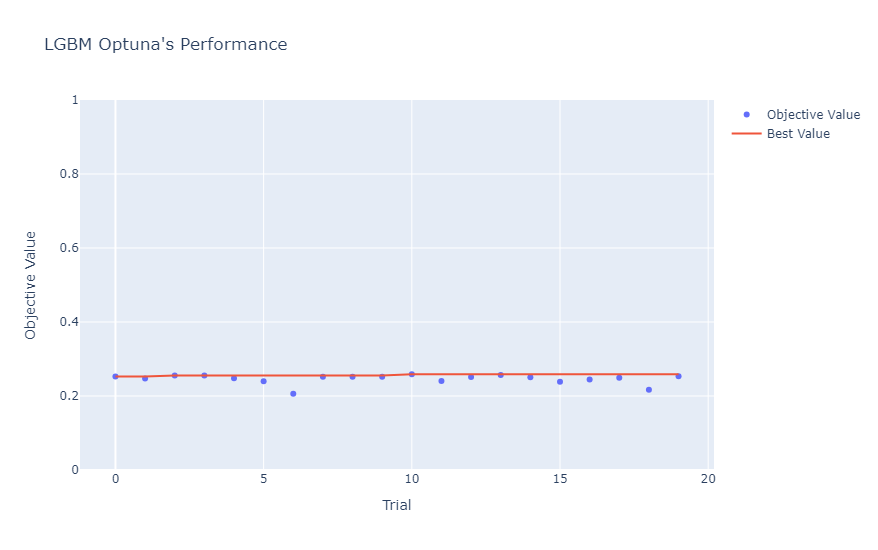

In [99]:
fig = plot_optimization_history(study_lgbm)
fig.update_layout(yaxis_range=[0, 1], title="LGBM Optuna's Performance", width=930, height=550)
fig.show()

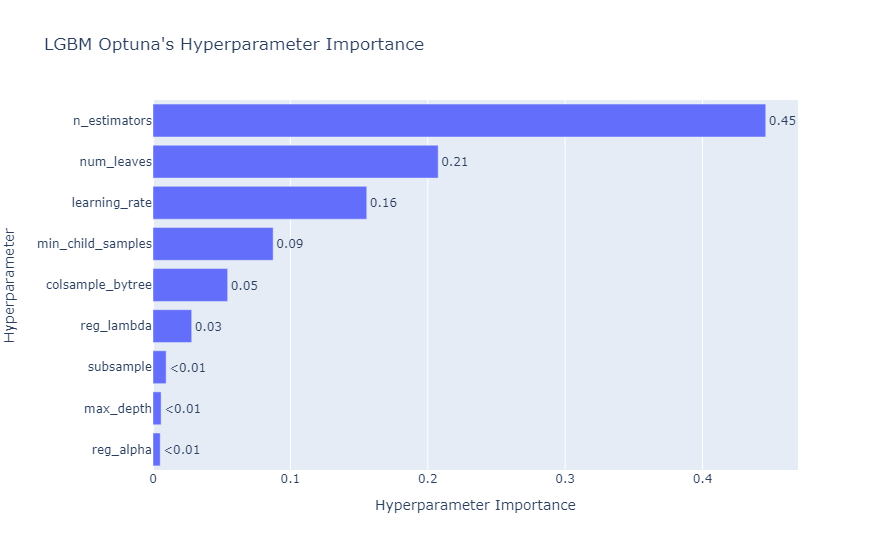

In [100]:
fig = plot_param_importances(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

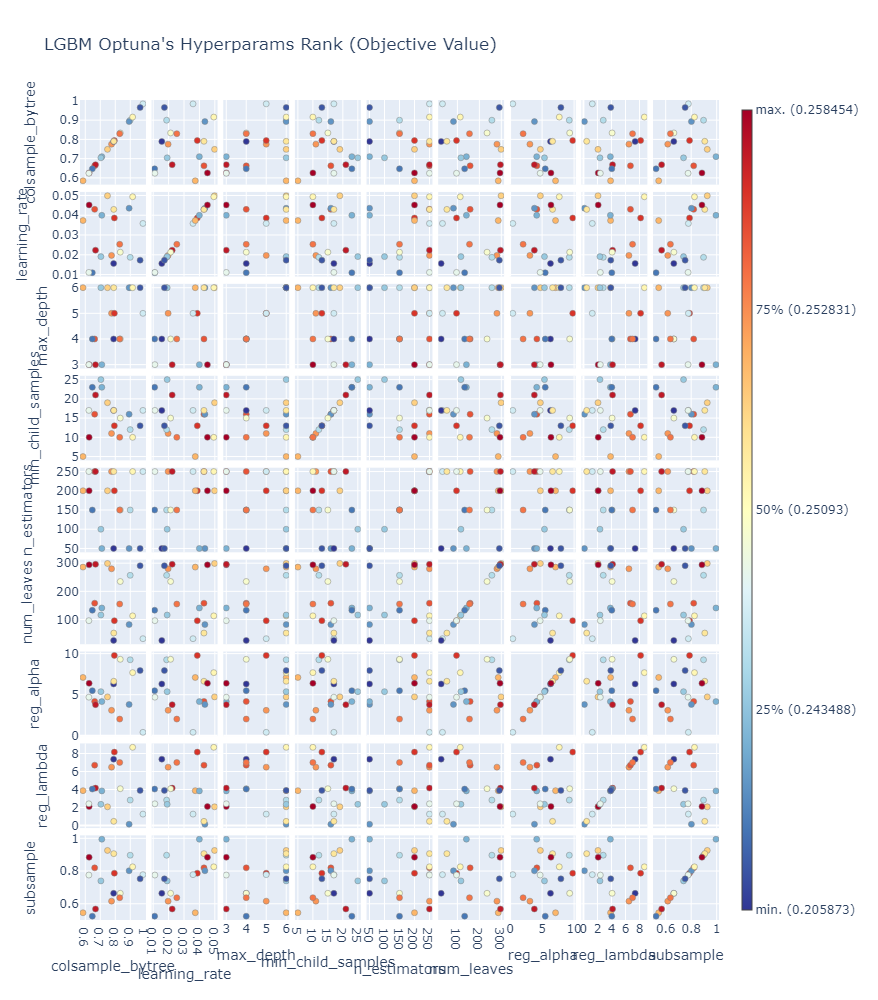

In [101]:
fig = plot_rank(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [102]:
lgbm_section = LGBMClassifier(**study_lgbm.best_trial.params)
lgbm_section.fit(X_scaled, y_section)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 130560
[LightGBM] [Info] Number of data points in the train set: 17661, number of used features: 512
[LightGBM] [Info] Start training from score -2.534887
[LightGBM] [Info] Start training from score -1.780107
[LightGBM] [Info] Start training from score -2.558009
[LightGBM] [Info] Start training from score -2.551452
[LightGBM] [Info] Start training from score -4.371942
[LightGBM] [Info] Start training from score -5.025524
[LightGBM] [Info] Start training from score -5.488655
[LightGBM] [Info] Start training from score -4.184403
[LightGBM] [Info] Start training from score -3.135324
[LightGBM] [Info] Start training from score -3.772761
[LightGBM] [Info] Start training from score -2.494293
[LightGBM] [Info] Start training from score -4.311054
[LightGBM] [Info] Start training from score -3.805304
[Light

LGBMClassifier(colsample_bytree=0.6259659270244702,
               learning_rate=0.04520746212412809, max_depth=3,
               min_child_samples=10, n_estimators=200, num_leaves=294,
               reg_alpha=6.385212745933922, reg_lambda=2.1068199626657713,
               subsample=0.884514386740253)

In [103]:
lgbm_section.score(X_rest_scaled, y_section_rest)

0.2867934136818876

In [104]:
classification_reporting(y_section_rest, lgbm_section.predict(X_rest_scaled))

                                      precision    recall  f1-score   support

     DIVISION (I) FORMATION OF IDEAS       0.38      0.35      0.36      5603
    DIVISION (I) INDIVIDUAL VOLITION       0.23      0.62      0.34     11912
DIVISION (II) COMMUNICATION OF IDEAS       0.34      0.28      0.31      5475
  DIVISION (II) INTERSOCIAL VOLITION       0.40      0.31      0.35      5510
    SECTION I. AFFECTIONS IN GENERAL       0.18      0.04      0.07       893
                SECTION I. EXISTENCE       0.11      0.03      0.05       466
        SECTION I. MATTER IN GENERAL       0.23      0.05      0.08       295
         SECTION I. SPACE IN GENERAL       0.34      0.16      0.21      1079
              SECTION II. DIMENSIONS       0.24      0.21      0.22      3072
        SECTION II. INORGANIC MATTER       0.27      0.14      0.19      1626
     SECTION II. PERSONAL AFFECTIONS       0.28      0.24      0.26      5833
                SECTION II. RELATION       0.33      0.14      

## 5. Results

> The range of scores of the model is between 18% to 29%. Its was not as we thought it could be but the best models so far where the 2 best known models the LightGBM and the XGBoost that both hitted 28.68% and 28.07%. Also the same notebook had run with both model's embeddings and with PCA on top and we present only best combination wich is the use model and without pca before.

In [105]:
lgbm_section = LGBMClassifier(**study_lgbm.best_trial.params)
lgbm_section.fit(pd.DataFrame(list(use_embeddings.Embeddings.values)), use_embeddings.Section)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.073877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 130560
[LightGBM] [Info] Number of data points in the train set: 88353, number of used features: 512
[LightGBM] [Info] Start training from score -2.535002
[LightGBM] [Info] Start training from score -1.780650
[LightGBM] [Info] Start training from score -2.558114
[LightGBM] [Info] Start training from score -2.551705
[LightGBM] [Info] Start training from score -4.371589
[LightGBM] [Info] Start training from score -5.022625
[LightGBM] [Info] Start training from score -5.481012
[LightGBM] [Info] Start training from score -4.182718
[LightGBM] [Info] Start training from score -3.135868
[LightGBM] [Info] Start training from score -3.772320
[LightGBM] [Info] Start training from score -2.494699
[LightGBM] [Info] Start training from score -4.309911
[LightGBM] [Info] Start training from score -3.805339
[Light

LGBMClassifier(colsample_bytree=0.6259659270244702,
               learning_rate=0.04520746212412809, max_depth=3,
               min_child_samples=10, n_estimators=200, num_leaves=294,
               reg_alpha=6.385212745933922, reg_lambda=2.1068199626657713,
               subsample=0.884514386740253)

In [106]:
dump(lgbm_section, 'Models/lgbm_section_model.joblib')

['Models/lgbm_section_model.joblib']

In [108]:
y_encoded = label_encoder.fit_transform(use_embeddings.Section)

xgboost_section = XGBClassifier(**study_xgb.best_trial.params)
xgboost_section.fit(pd.DataFrame(list(use_embeddings.Embeddings.values)), y_encoded)

XGBClassifier(alpha=0.7283568834733367, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.913374696645104, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=6.921899263427361,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=3.911006914777415,
              learning_rate=0.04384241025612852, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None, ...)

In [109]:
dump(xgboost_section, 'Models/xgboost_section_model.joblib')

['Models/xgboost_section_model.joblib']

**How to further improve the predictions**

the models didn't even hit a 30% accuracy in the prediction part but there are more unexplored paths that could lead to even higher scores. Some of them are the following:

1. Try use neural networks
2. Use a different model for embeddings
3. Use sentences with the meaning of the word as inputs in the models could lead to better embeddings
4. Train for longer with optuna
5. Dimensionality reduction without PCA